note - can use Contents to navigate

# OVERVIEW: What is in this notebook relative to the initial brief?



Import satellite or aerial images from the designated data directory.
- <font color='red'>Straightforward enough, there are 6 test images</font>

Conduct image preprocessing to optimize data quality.
- <font color='red'>The models in use are pretrained or fine-tuned. Torch handily has a method for each set of weights that matches any processing carried out during the model's pretraining, so I make use of it.</font>

Detect major types of objects such as buildings, cars or airplanes.
- <font color='red'>Demonstrated on images from the test set, first using COCO pretrained Mask R-CNN from Torch and an ultralytics YOLOv8</font>

Employ detection techniques to identify the precise building footprints.
- <font color='red'>Demonstrated using a fine-tuned YOLOv8 (beginning at COCO pretrained), where fine-tuning has been carried out with an open source dataset hosted at Roboflow with images that are qualitatively similar to the 6 test images (zoom level, building density etc.) Better options for data were available and should be used if carrying out this task for real rather than demonstrating; I discuss further below.</font>

Generate a GeoJSON file containing polygon representations of the detected building footprints.
- <font color='red'>**TO MY KNOWLEDGE** this appears to be highly non-trivial and I have not made an attempt. Possibly there is an API or library that will smooth this process, but many implementations use 'Douglas-Peucker', Microsoft use a different novel algorithm that they say is less greedy.</font>

Create new images with the building footprints superimposed for visualization.
- <font color='red'>Completed - segmentation masks and bounding boxes shown on all test images before and after fine-tuning was carried out. I have also hosted the model on Hugging face and made a separate short notebook which will import the model where you can generate footprints on other images</font>

Obtain or generate tagged images of damaged buildings.
- <font color='red'>Demonstrated, but I do not build or import a damage classifier in this notebook, so the demonstration is of the process of just producing snips of buildings detected in the test images</font>

Determine the presence or absence of damage to the buildings.

Assess the degree of damage, categorizing it on a scale ranging from 'none' to 'low,' 'medium,' 'high,' or 'full.'
- <font color='red'>To fully complete this task a multi-stage model is required - first an instance/semantic segmentation predictor, followed by a classification (or regression, preferred) model training on damage labels. Though building and training a classification model is much more straightforward than instance segmentation, acquiring and managing the data for part II would extend the time to complete this demo by too much. I do not carry it out in the notebook but discuss how it would be done.</font>

# Introduction



---

\

Welcome to my attempts, the work to do this was carried out on 21/11 and written up on 22+23/11. Prior to this, most of my computer vision experience has been in hand-building models in PyTorch that cater to image-to-image regression problems. That means I've seen some of the relevant architectures that have won competitions aimed at this kind of task before e.g. U-Net, Vision Transformer, ResNet etc. but not practically handled a segmentation task myself.

It may not be a surprise then that almost all of the time was spent researching the standard tools and particularly the data I could use. Having only 6 test images without labels means immediately that other data sources need to be found and put to use, and the similarity between the tasks of training on the external data and carrying out the requriement in the brief will determine how effective the solution is. That being said, given that there are no explicit labels it's not possible to actually quantify how well the final model performs on the test images, other than by visual inspection of the results of the segmentation.

For that reason I show the differences between the detections achieved with out-of-the-box pretrained (COCO) models and the detections achieved after fine-tuning against some building footprint data, essentially showing how much better a fine-tuned model is than one that is out-of-the-box. This is also to show that I am not simply picking up a model I found online which can approximately do the job and detecting buildings with that, but applying the necessary principle of selecting data that is going to provide a good training context for the problem.

\

---

\

To talk a bit more about the exact statement of the problem:

The task is to assess the damage level of buildings from satellite images automatically. There are therefore two stages; buildings need to be detected, and then the damage level of each found building needs to be individually inferred. Because we want to take crops of each building from the images to carry out the damage inference, that means we must either semantically segment the image (i.e. predict all pixel regions carrying the class 'building') OR instance segment (i.e. predict all distinct regions " "). Both could be (and are) used to find footprints - I opted for instance segmentation since this should intrinsically be attempting to separate buildings at close boundaries where semantic segmentation does not.

The standard tool for instance segmentation is the Mask R-CNN https://arxiv.org/abs/1703.06870, which has a dedicated class in base PyTorch. This was my starting point and I use it to carry out the basic detection task, but later in my search for data I found a library https://github.com/ultralytics that uses a command line interface that has easy access to data which looked close to what was required, so I switched to that to do footprint detection.

The second task of classifying building damage has very well-trodden methods and that I am more familiar with. To do it I would likely be building and optimizing a ResNet. The issue is that I could find only one data set with damage labels that looked viable here https://xview2.org/ (there's a good chance you're already aware of that dataset), but after trying to use their automatic sign up I didn't receive anything from them that let me download the data. So without labelling images myself, this part of the problem was not possible. When carrying out this task in a real setting, I would be going for that dataset as a priority.

\

Here's a summary of the things I found while researching:
- two repos with lists of satellite datasets which were very handy https://github.com/chrieke/awesome-satellite-imagery-datasets and https://github.com/satellite-image-deep-learning/datasets
- various bits of research... a paper showing some vision model benchmarks for our building footprint segmentation problem https://hal.science/hal-02948177/document
- someone's masters' thesis, again covering building footprint segmentation https://liu.diva-portal.org/smash/get/diva2:1417200/FULLTEXT01.pdf
- a paper looking at super-resolution instance segmentation of buildings in Japan https://www.sciencedirect.com/science/article/pii/S0924271622002933?ref=pdf_download&fr=RR-2&rr=82a496189aa06412
- GeoSeg, a full repo dedicated to model testing for building segmentation https://github.com/WangLibo1995/GeoSeg. sadly I could not make use of it since I am limited to Colab notebooks
- The AIRS dataset, potentially useful but not what I went for https://paperswithcode.com/dataset/airs

- Microsoft's giant datasets of building footprints https://github.com/Microsoft/CanadianBuildingFootprints (Canada) which also contain GEOjson evaluations. Following that link they mention their polygonization strategy to make the GEOjsons, and after reading their comments I decided against trying it within this demo
- xView2 - a competition providing damage labels as well as footprints, perfect for our purposes as I mentioned https://arxiv.org/abs/1911.09296 this has multiple solutions uploaded to github here https://github.com/nimaafshar/metadamagenet, here https://github.com/michal2409/xView2, here https://github.com/nka77/DAHiTra, that couldn't be leveraged inside a Colab notebook. These are excellent places to start
- another competition for building segmentation providing footprints https://www.drivendata.org/competitions/60/building-segmentation-disaster-resilience/ which spawned solutions well worth looking at, the best solution having an mAP50 at ~86%.

\

finally, there is an open source dataset for the problem available at roboflow https://universe.roboflow.com/roboflow-universe-projects/buildings-instance-segmentation/dataset/4, which allows acquisition of the data under many well-known model conventions. **This is the dataset I settled on using**. They allow model options of which I chose the recent YOLOv8 model and also briefly tested the even more recent SAM https://segment-anything.com/, but fine tuning this foundation model is not yet supported. more about SAM at the end of the notebook.

\

---





# How would the task be carried out without interview-task-type time constraints?


1. Making use of and customising the Xview2 dataset as well as Microsoft footprint data, or other data if found to be better
  - also, begin the process of labelling our own data for building damage or other relevant features. More data with high specificity for the problem is the ideal scenario.
2. While academic paper detection models are good, instead aim at reproducing competition winning detection models based on what seems achievable.
  - for example, I've hand built U-nets before along the lines of the U-net ensemble used in the DrivenData winner's solution https://drivendata.co/blog/open-cities-disaster-winners/ (referring to 1st place)
3. the SAM foundation model from Meta looks like it will be a very important tool for computer vision in the near future, as ChatGPT is for language applications now. I show examples of the segmentation capability on the task images at the end of the notebook.
  - but, the model is not available (that I could find) for fine tuning yet. In their paper, they also mention that it will incorporate a text encoder -  meaning that it could be used to label our own data very quickly and accurately.
4. My guess is that the task of GEOjson conversion from segmentation masks is not just a throwaway request in the brief. It's difficult though, I think it might technically be NP-hard. The task breaks down into two parts    
  - firstly, creation of a polygon from a blob of pixels. Microsoft (see [here](https://github.com/Microsoft/CanadianBuildingFootprints)) use their own algorithm and other implementations use a variant of 'Douglas-Peucker'
  - secondly the conversion of the created polygon's image-space vertices into latitude and longitude to match the GEOjson format. This is likely already a task that your data engineers routinely carry out using the location and scale of the satellite images.
  - My plan would be to look into the standard algorithm and Microsoft's own implementation for creating the polygons, but novel machine learning methods could also be used to solve this step, depending on how important accuracy of the GEOjson is.

In summary - the process would be:
- decide on a competition detection model to replicate
- spend the time to pull in xview2 and microsoft footprint data
- talk with data engineers about beginning the labelling of our own data, if appropriate
- hand build a regression model for damage assessment. this part is far more straightforward: model building is very easy and labelling is not intensive (just decide a damage number for each building, no pixel by pixel checking..)
- decide on (alongside data engineers) a GEOjson conversion algorithm for footprints

I would expect an effective working implementation of the tools with close-to-competition standard precision at 3 months. A full model of this nature is probably worthy of publishing.



# CODE - Basic Detection Demo using PyTorch

In [ ]:
import os
import numpy as np
import pylab as plt
import torch

I'll carry out the basic detection demo of objects in the images using Torch, since that's what I'm more familiar with.

Torch has a dedicated class for the Mask R-CNN used for instance segmentation https://pytorch.org/vision/main/models/mask_rcnn.html

The model is pretrained on COCO 2017 which means it will return detections for 80 different classes of 'standard' objects out of the box.

Preprocessing steps can be matched with those used at pretraining by using the .transforms() method of the pretrained weights.

In [ ]:
from torchvision.models.detection import maskrcnn_resnet50_fpn, MaskRCNN_ResNet50_FPN_Weights

weights = MaskRCNN_ResNet50_FPN_Weights.DEFAULT # read in the COCO 2017 pre-trained weights
transforms = weights.transforms()               # defines the preprocessing function to match pretraining

model = maskrcnn_resnet50_fpn(weights=weights, progress=False) # instantiate the model, and use the pretrained weights
model = model.eval()        # we don't wish to train the model at this time

This is the architecture of the Mask RCNN, credit [here](https://www.researchgate.net/publication/346075907_Deep_learning-based_instance_segmentation_of_cracks_from_shield_tunnel_lining_images)

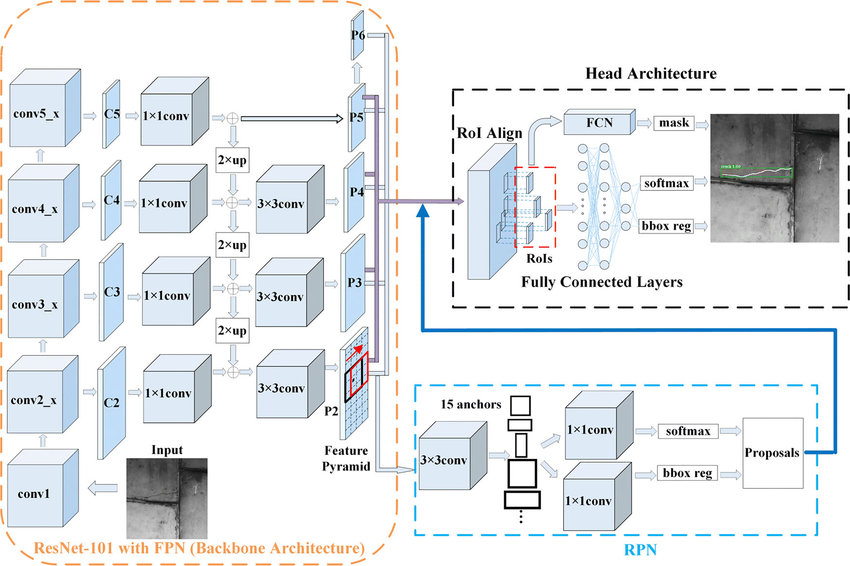

It uses a ResNet 'backbone' (i.e. initial layer structure), and contains a region proposal network for mask prediction in tandem with the final postprocessing layers.

It's important to see which classes the model is currently able to detect, so I've got a helper function for pulling the class name strings.

Then, we print a list of all of the strings attached to the integer class labels. These are the COCO 2017 classes.

In [ ]:
def get_label(label):
  # takes a class label and returns the associated string containing the name
  return weights.meta["categories"][label]

class_names = model.roi_heads.box_predictor.cls_score.out_features
class_names = [get_label(i) for i in range(class_names)]

print(class_names)

['__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


So with these classes, this model can do the job of detecting standard objects like cars and airplanes. Worth bearing in mind though, that the COCO dataset training images had their classes taking up large fractions of the image, while the 6 test images given are from high altitude, so the same objects are much smaller and are being viewed at a perpendicular angle to the ground. Thus the detection performance will definitely not be optimal, but it should still catch things

In [ ]:
from torchvision.io import read_image

image_unprocessed = read_image('image_6.jpeg')
image = transforms(image_unprocessed).unsqueeze(0)  # using the pretraining preprocessing steps
output = model(image)[0]                            # performing the forward pass through the Mask R-CNN to obtain predictions


below: Helper function to list detections and their model assigned probabilities (scores).

I set the score threshold to 30%

In [ ]:
def get_detections_above_threshold(res, threshold):
  detections = [get_label(label) for label in res['labels']]
  scores = [x for x in res['scores']]
  for i,x in enumerate(detections):
    if scores[i] >= score_threshold: print(f'{detections[i]:<15}' + f'{scores[i]:.3f}')

score_threshold = 0.3

get_detections_above_threshold(output, score_threshold)


airplane       0.996
airplane       0.986
person         0.830
truck          0.740
bench          0.733
suitcase       0.721
car            0.613
person         0.436
car            0.375
truck          0.359
truck          0.354
car            0.315
car            0.305


From the above list, there were multiple detections in image_6.jpeg with the COCO pretrained model.

Let's superimpose the results on the image:

First image below - superimposed segmentation masks

Second image below - bounding boxes and labels displayed

In [ ]:
from torchvision.utils import draw_segmentation_masks, draw_bounding_boxes
import torchvision.transforms.functional as F


bool_masks = output['masks'] > 0.5 #  taking +ve values

bool_masks = bool_masks.squeeze(1) #  extra dim for some reason

def show(imgs):                    # helper function from Torch docs
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=(16,12))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

show(draw_segmentation_masks(image_unprocessed, bool_masks, alpha=0.5))

labels = [f"{label}: {score:.3f}" for label, score in zip(output["labels"], output["scores"])]

show(draw_bounding_boxes(image_unprocessed, boxes=output['boxes'][output['scores']>score_threshold], \
                         labels=[get_label(x) for x in output['labels'][output['scores']>score_threshold]] , width=2))

Output hidden; open in https://colab.research.google.com to view.

A couple of airplanes are correctly predicted, another is apparently a bench. Other labels are visibly incorrect. Not unexpected since this is out-of-the-box pretrained.

Let's try on another image, this time only plotting the boxes

In [ ]:
image_unprocessed = read_image('image_3.jpeg')         # now using image_3.jpeg
image = transforms(image_unprocessed).unsqueeze(0)
output = model(image)[0]

get_detections_above_threshold(output, score_threshold)

bool_masks = (output['masks'] > 0.5).unsqueeze(1)

labels = [f"{label}: {score:.3f}" for label, score in zip(output["labels"], output["scores"])]

show(draw_bounding_boxes(image_unprocessed, boxes=output['boxes'][output['scores']>score_threshold], \
                         labels=[get_label(x) for x in output['labels'][output['scores']>score_threshold]] , width=2))

Output hidden; open in https://colab.research.google.com to view.

Again, detection performance is not great. The set of trees in the black bounding box has been predicted the class 'potted plant' with score ~0.6, since potted plants might be expected to take up a similar area on a COCO 2017 image.

## COMMENTS

This is a basic detection demo. Some COCO objects that appear in the images were picked up e.g. airplanes, cars, but without fine-tuning the performance is guaranteed to be very limited. There are various datasets that exist which label these objects from an aerial view which could be used to fine tune, e.g. [iSAID](https://captain-whu.github.io/iSAID/dataset.html), [xview1](http://xviewdataset.org/), or others found here https://github.com/chrieke/awesome-satellite-imagery-datasets

# CODE - Building Footprint Instance Segmentation Demo: Fine-Tuned YOLOv8-seg

---

\

As outlined in the intro, I had to do some research to find data that would roughly match the building footprint training requirement. I found many, and settled on the data found here https://universe.roboflow.com/roboflow-universe-projects/buildings-instance-segmentation/browse?queryText=&pageSize=200&startingIndex=2200&browseQuery=true

This dataset contains open source labelled images that have a similar height and building density to the 6 test images. The images are taken from various locations; Chicago, Austin, Tripoli, Mykolaiv, Donetsk + more.

The idea then is to take a pretrained model like the Mask R-CNN above and use this data to 'fine-tune' it's pretrained weights to match the building footprint segmentation task. The upshot of using a pretrained model is that it is already in principle very good at doing the fundamental task of detecting objects. If we change the downstream task from the original one (of predicting 80 standard COCO classes) to one of predicting building footprints, then the hope is that the model will retain it's object detection ability, and 'transfer' this to the new task of building footprint segmentation. This is 'transfer learning'.

In many cases it's ideal to hold weights stationary earlier in the model since these are more likely to be responsible for the transformations involved in doing the more basic task of guessing the pixel mask of objects, and only allow gradient descent on later weights. Having a good foundation model will greatly enhance the capabilities of the model overall, so using something like Meta's new SAM https://segment-anything.com/ (when it becomes available for fine-tuning) would improve outcomes by a large fraction. I show briefly at the end of this notebook what SAM is capable of, and it does look to be a significant improvement on the Mask R-CNN and YOLOv8s that I use here.

\

---

\

To carry out fine-tuning I use the Ultralytics https://github.com/ultralytics engine, from which I take a COCO 2017 pre-trained YOLOv8 (same pretraining as the Mask R-CNN above). It uses a command line interface (CLI) to remove not just all of the model boilerplate, but all of the data engineering tasks involved in standardising the chosen data set so that it can be digested by the model. Two other big bonuses are having direct access to the data set I found and being usable inside a Colab notebook.

In the case of carrying out this task for real, a CLI will contain too many broad strokes and the data engineering side cannot be left to automatic calls. The best possible data I could find (mentioned in intro) would not directly usable with this CLI, for example. The interface does take lots of useful measures on it's own that I will point out.

## YOLOv8 architecture

This is the architecture of the YOLOv8, credit [here](https://www.researchgate.net/publication/346075907_Deep_learning-based_instance_segmentation_of_cracks_from_shield_tunnel_lining_images)
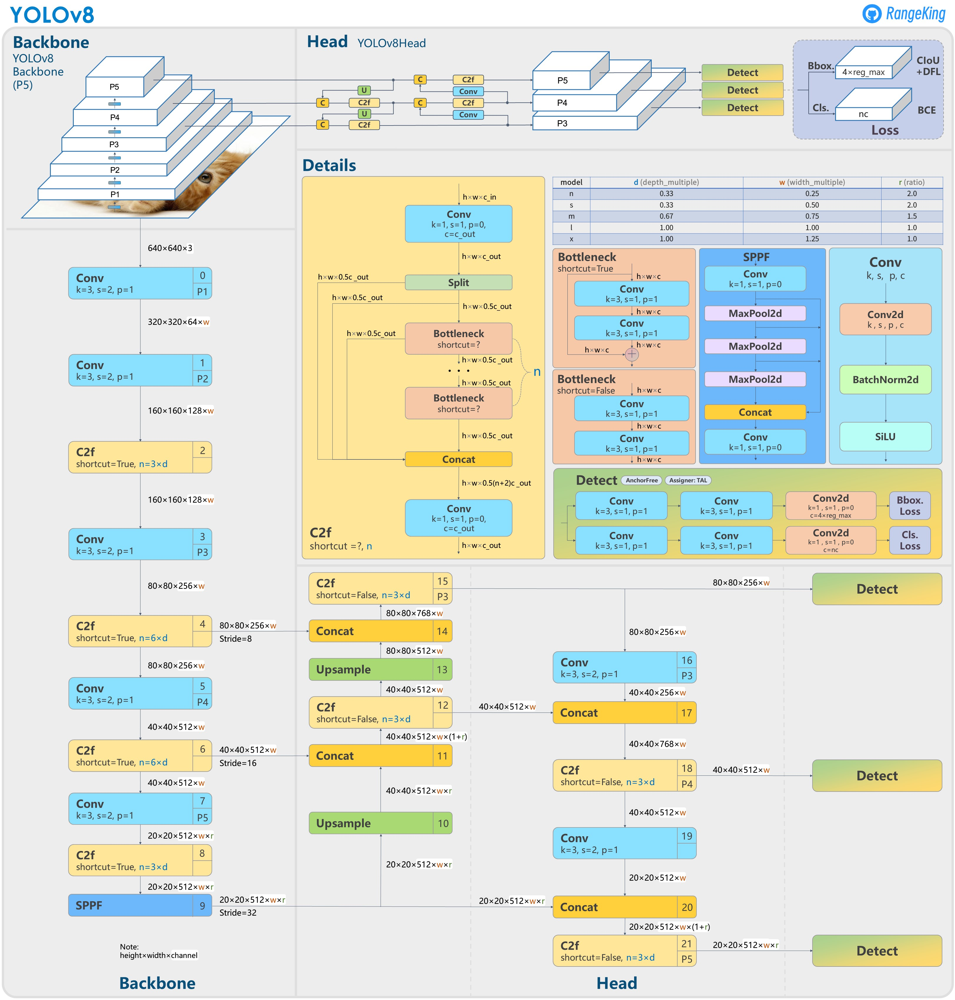

## Preliminary installs

In [ ]:
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!pip install ultralytics==8.0.28

from IPython import display, Image

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 27.1/166.8 GB disk)


Ultralytics has the command line interface and pretrained models accessible, and the dataset I want to use is hosted at Roboflow, which is supported by Ultralytics. If you want to run this notebook directly, you would need to log in there. However, to prevent the need for this I have added another notebook which allows you to pull in my trained weights directly from Hugging Face, the 'Live Prediction' notebook in the same GitHub repo.

In [ ]:
! pip install roboflow -q

import roboflow
from roboflow import Roboflow

roboflow.login()

rf = Roboflow()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 36.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.3 MB/s eta 0:00:00
visit https://app.roboflow.com/auth-cli to get your authentication token.
Paste the authentication token here: ··········


In [ ]:
from ultralytics import YOLO

## BEFORE Fine-tuning - all 6 test images

Below is the command line interface in action. Since we won't be changing anything at all in the model architecture, this level of control is all that is needed.

What I want to show here is how effective the prediction is **BEFORE and AFTER** the fine-tuning process happens: these 6 images show the BEFORE, i.e. out-of-the-box COCO pretrained YOLOv8 detections and segmentations.

/content
100% 22.8M/22.8M [00:00<00:00, 158MB/s] 
2023-11-22 17:28:33.424883: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-22 17:28:33.424930: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-22 17:28:33.428144: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-22 17:28:35.658676: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11810560 parameters, 0 gradients, 42.6 GFLOPs

image 1/1 /co

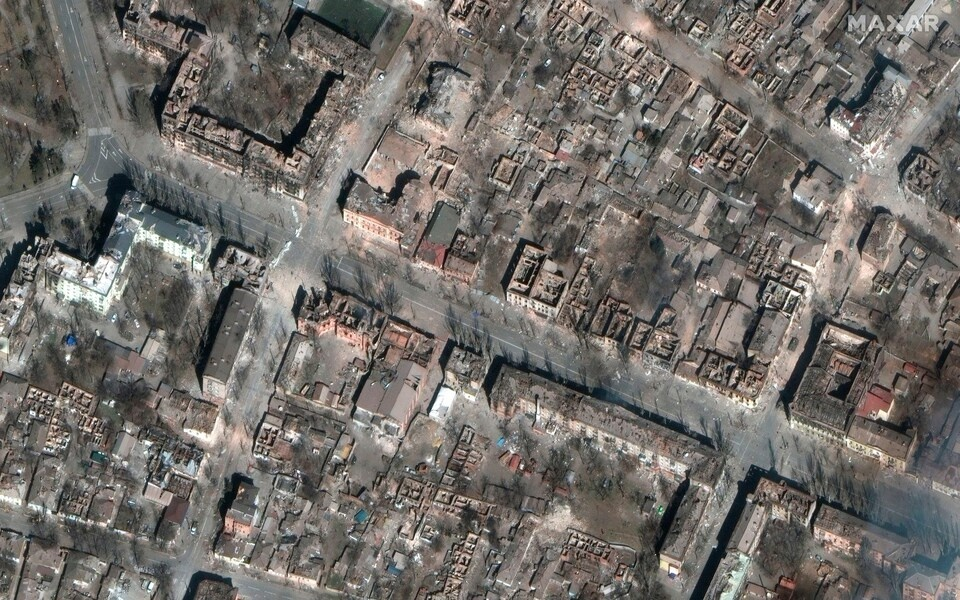

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model=yolov8s-seg.pt conf=0.25 source='image_1.jpeg' save=true
%cd {HOME}
Image(filename='runs/segment/predict/image_1.jpeg', height=600)

/content
2023-11-22 17:29:36.161118: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-22 17:29:36.161169: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-22 17:29:36.161198: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-22 17:29:37.226155: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11810560 parameters, 0 gradients, 42.6 GFLOPs

image 1/1 /content/image_2.jpg: 448x640 87.3ms
Speed: 

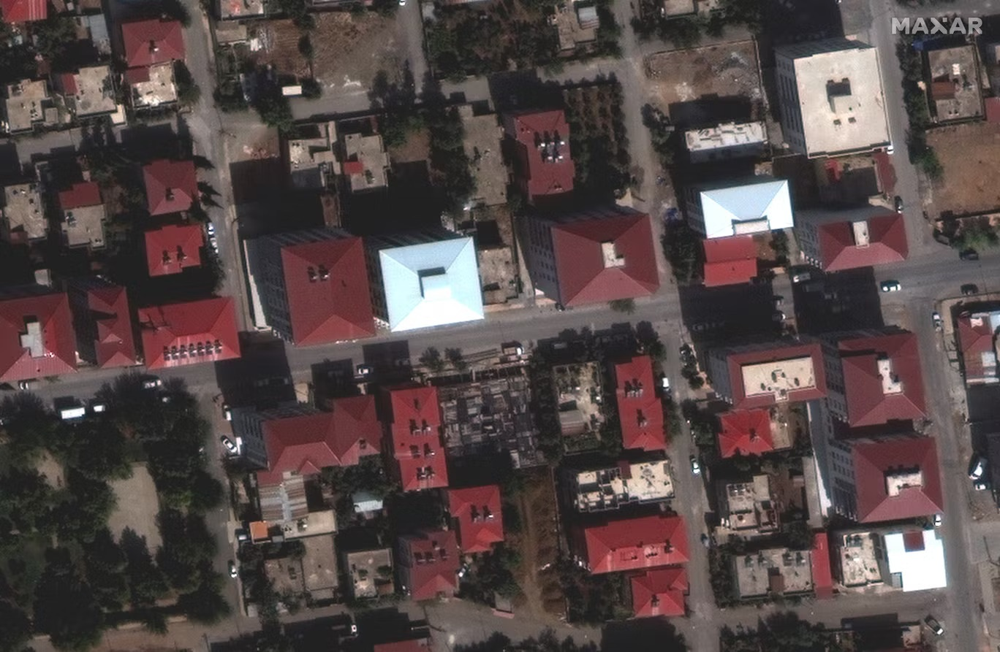

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model=yolov8s-seg.pt conf=0.25 source='image_2.jpg' save=true
%cd {HOME}
Image(filename='runs/segment/predict2/image_2.jpg', height=600)

/content
2023-11-22 17:30:11.995986: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-22 17:30:11.996043: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-22 17:30:11.996070: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-22 17:30:13.017583: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11810560 parameters, 0 gradients, 42.6 GFLOPs

image 1/1 /content/image_3.jpeg: 416x640 84.2ms
Speed:

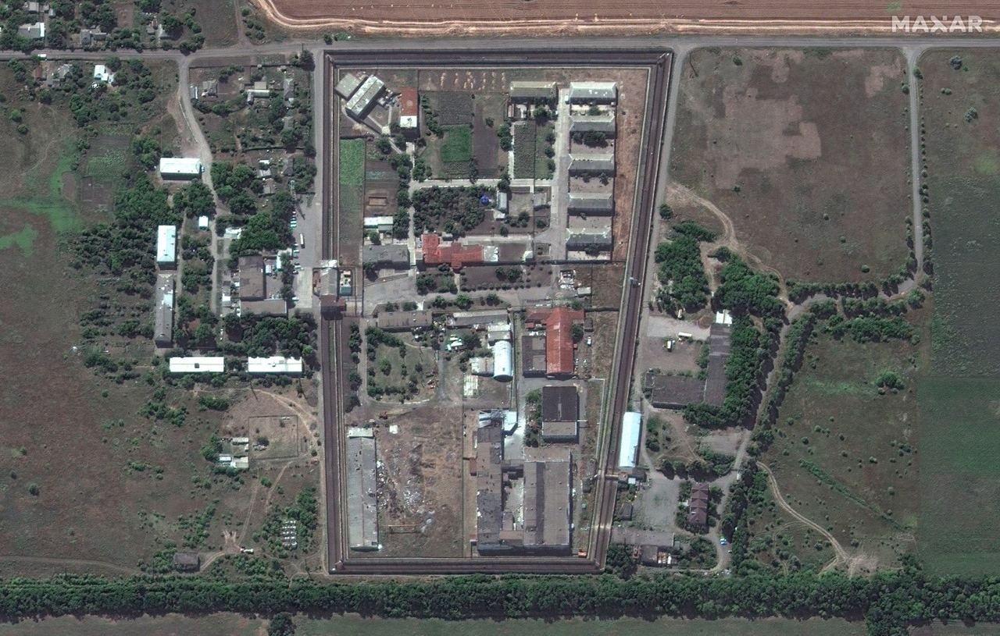

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model=yolov8s-seg.pt conf=0.25 source='image_3.jpeg' save=true
%cd {HOME}
Image(filename='runs/segment/predict3/image_3.jpeg', height=600)

/content
2023-11-22 17:31:13.634255: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-22 17:31:13.634314: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-22 17:31:13.634360: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-22 17:31:14.669123: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11810560 parameters, 0 gradients, 42.6 GFLOPs

image 1/1 /content/image_4.jpeg: 384x640 1 car, 81.0ms

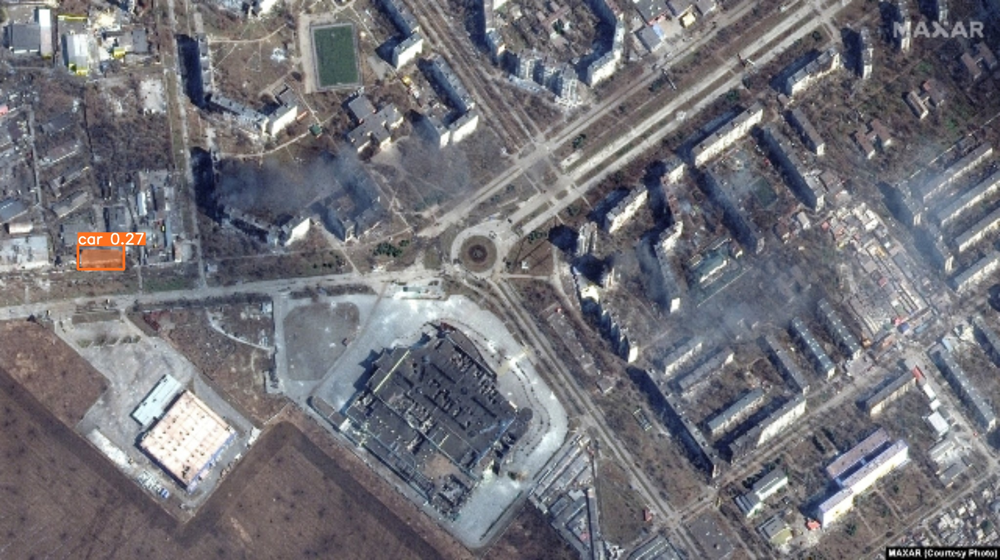

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model=yolov8s-seg.pt conf=0.25 source='image_4.jpeg' save=true
%cd {HOME}
Image(filename='runs/segment/predict4/image_4.jpeg', height=600)

That is definitely not a car.

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model=yolov8s-seg.pt conf=0.25 source='image_5.jpeg' save=true
%cd {HOME}
Image(filename='runs/segment/predict5/image_5.jpeg', height=600)

Output hidden; open in https://colab.research.google.com to view.

/content
2023-11-22 17:31:37.959236: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-22 17:31:37.959293: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-22 17:31:37.959320: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-22 17:31:39.004324: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11810560 parameters, 0 gradients, 42.6 GFLOPs

image 1/1 /content/image_6.jpeg: 416x640 1 car, 1 bus,

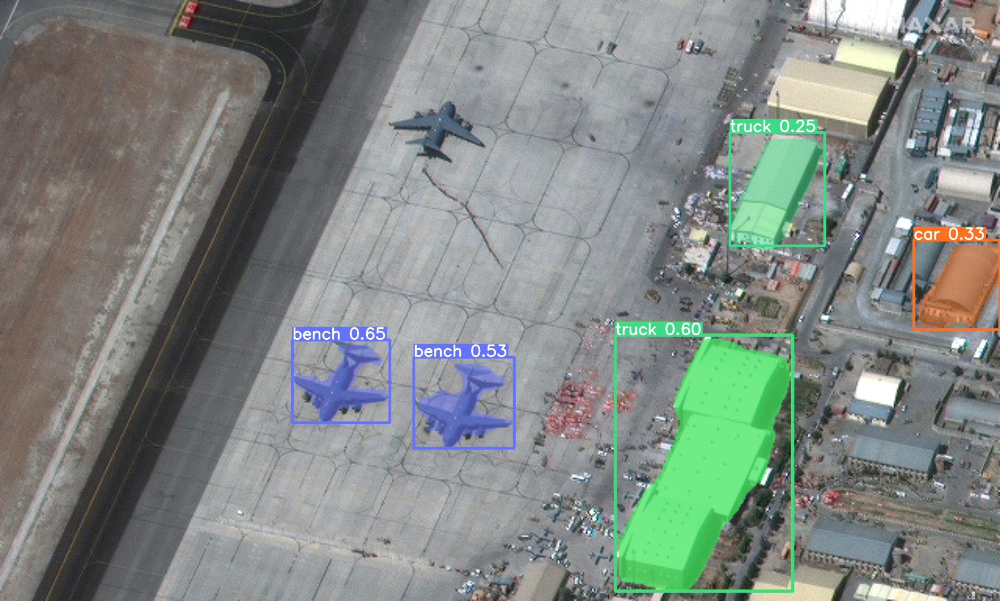

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model=yolov8s-seg.pt conf=0.25 source='image_6.jpeg' save=true
%cd {HOME}
Image(filename='runs/segment/predict6/image_6.jpeg', height=600)

### COMMENTS

As expected, and just like the Torch Mask R-CNN, out of the box performance is not great. In fact, it's markedly worse here than with the Mask R-CNN. Now let's fine-tune and see if we can get some building classes predicted.

## FINE-TUNING the model with building footprint labels

I'll be pulling in the dataset [here](https://universe.roboflow.com/roboflow-universe-projects/buildings-instance-segmentation/browse?queryText=&pageSize=200&startingIndex=2200&browseQuery=true). You can follow that link to browse the images and labels if desired. Roboflow allows pulling it all in with the correct configuration for the YOLOv8 automatically.

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

project = rf.workspace("roboflow-universe-projects").project("buildings-instance-segmentation")
dataset = project.version(4).download("yolov8")

/content/datasets
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.28, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Buildings-Instance-Segmentation-4 in yolov8:: 100%|██████████| 32870/32870 [00:04<00:00, 7076.45it/s]


That's the data set downloaded, split for train/val/test with the correct label formatting.

\

---

\

Now we want to train the YOLOv8 on this data, so that it will segment buildings rather than COCO classes. It's approx 10k images and I'll run for 20 epochs; this notebook has access to a Tesla T4 so it should be a couple of hours.

The ultralytics CLI training cycle uses SGD by default, for demo purposes I'm happy with that, but there is also the possibility for Adam and it's variants. The text output during training tracks box loss, seg mask loss, classification cross-entropy and another loss function 'dfl' that I'm not familiar with. At the validation step it outputs the box and mask mAP50's which are standard comparison metrics: the precision at detection IOU of 0.5 and above, essentially fraction of true positives for boxes that covered by area at least half of the ground truth box.

The default training cycle also adds a blurring effect for regularization until the last 10 epochs. Very nice. (This is why you see a jump in segmentation loss between epoch 10-11, the blurring filter is removed at that point)

\

---

\

In [ ]:
%cd {HOME}

!yolo task=segment mode=train model=yolov8s-seg.pt data={dataset.location}/data.yaml epochs=20 imgsz=640

/content
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/content/datasets/Buildings-Instance-Segmentation-4/data.yaml, epochs=20, patience=50, batch=16, imgsz=640, save=True, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, 

Training is complete, let's see the confusion matrix

/content


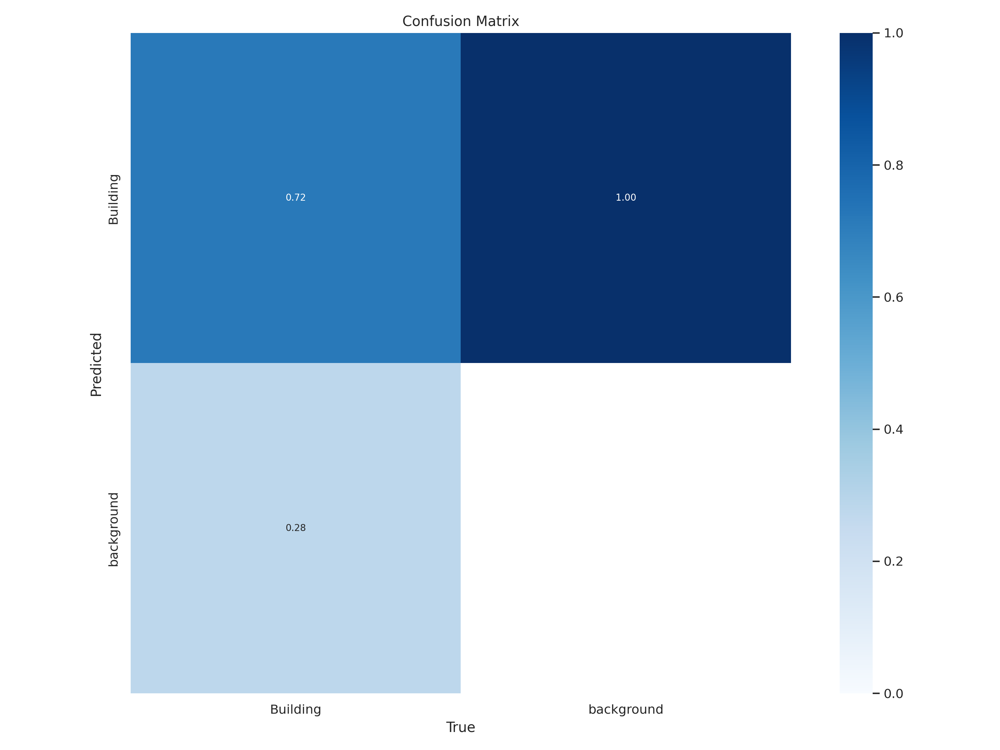

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train3/confusion_matrix.png', width=600)

mAP of 0.72 for the building detection and corresponding 0.28 for false negatives, a useful comparison would be the aforementioned DrivenData competition-winning model, which had a score of ~0.86.

Note that there is a large building-background confusion here, which would be something to focus on for future attempts.

Below are some training loss summaries. Nothing unexpected, the losses decreased and the mAP's increased.

/content


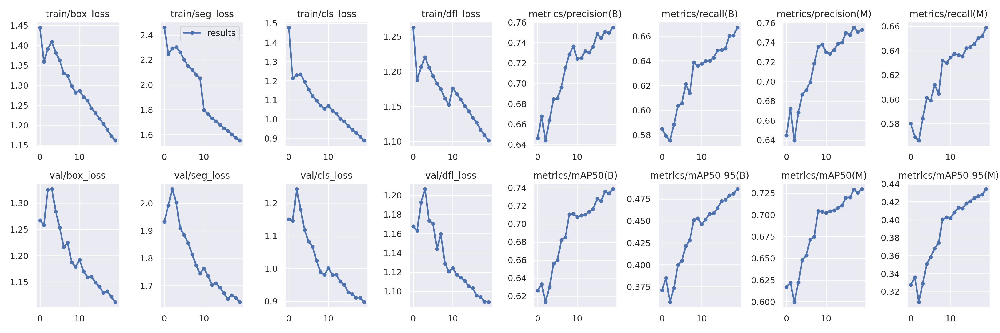

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train3/results.png', width=600)

## AFTER Fine-tuning: all 6 test images

These are the re-attempts at prediction using the same YOLOv8 model above, **AFTER** it has been fine-tuned for 20 epochs. Now we are expecting better segmentations and classifications where there were previously none. These 6 images should be compared with the 6 in the BEFORE section.

/content
2023-11-22 20:51:09.419741: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-22 20:51:09.419796: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-22 20:51:09.419836: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-22 20:51:10.433103: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

image 1/1 /content/image_1.jpeg: 416x640 29 Buildings,

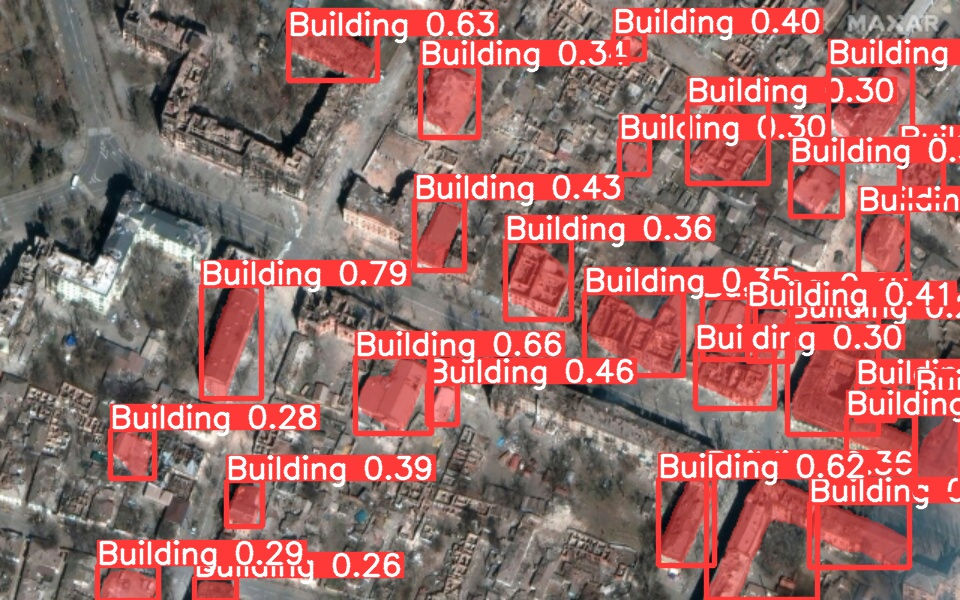

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train3/weights/best.pt conf=0.25 source='image_1.jpeg' save=true
%cd {HOME}
Image(filename='runs/segment/predict7/image_1.jpeg', height=600)

/content
2023-11-22 20:52:06.412391: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-22 20:52:06.412442: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-22 20:52:06.412469: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-22 20:52:07.480640: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

image 1/1 /content/image_2.jpg: 448x640 54 Buildings, 

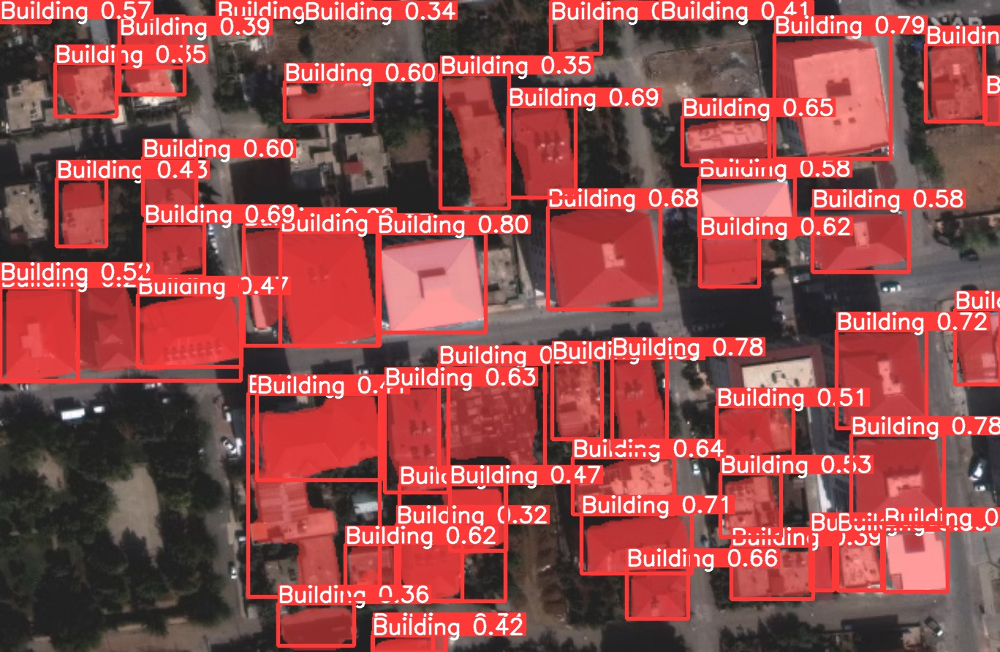

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train3/weights/best.pt conf=0.25 source='image_2.jpg' save=true
%cd {HOME}
Image(filename='runs/segment/predict8/image_2.jpg', height=600)

/content
2023-11-22 20:53:04.994988: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-22 20:53:04.995058: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-22 20:53:04.995107: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-22 20:53:06.096914: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

image 1/1 /content/image_3.jpeg: 416x640 36 Buildings,

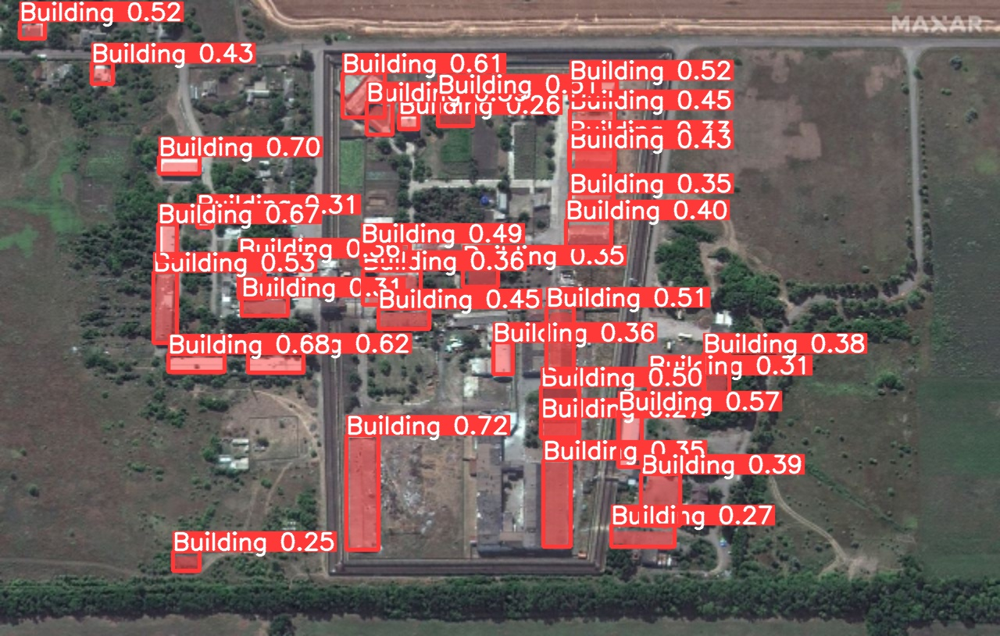

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train3/weights/best.pt conf=0.25 source='image_3.jpeg' save=true
%cd {HOME}
Image(filename='runs/segment/predict9/image_3.jpeg', height=600)

/content
2023-11-22 20:53:22.305265: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-22 20:53:22.305318: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-22 20:53:22.305358: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-22 20:53:23.417828: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

image 1/1 /content/image_4.jpeg: 384x640 38 Buildings,

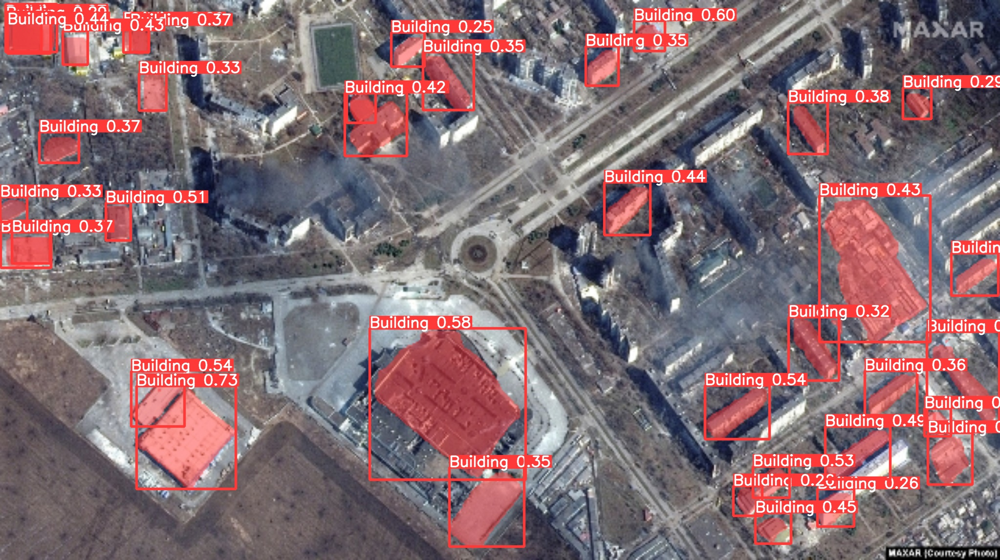

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train3/weights/best.pt conf=0.25 source='image_4.jpeg' save=true
%cd {HOME}
Image(filename='runs/segment/predict10/image_4.jpeg', height=600)

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train3/weights/best.pt conf=0.25 source='image_5.jpeg' save=true
%cd {HOME}
Image(filename='runs/segment/predict11/image_5.jpeg', height=600)

Output hidden; open in https://colab.research.google.com to view.

/content
2023-11-22 20:53:57.467775: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-22 20:53:57.467834: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-22 20:53:57.467870: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-22 20:53:58.511188: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

image 1/1 /content/image_6.jpeg: 416x640 20 Buildings,

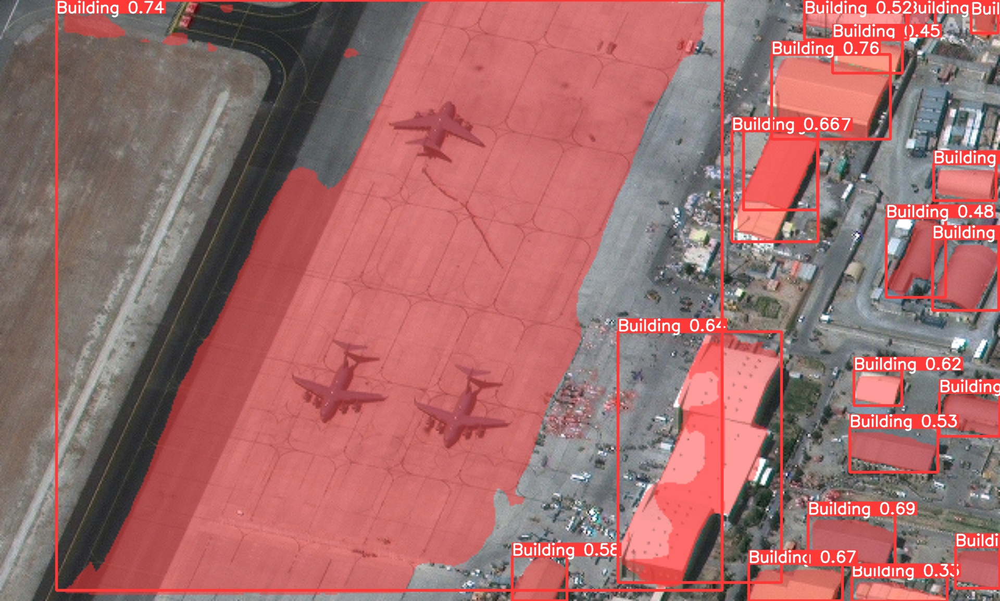

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train3/weights/best.pt conf=0.25 source='image_6.jpeg' save=true
%cd {HOME}
Image(filename='runs/segment/predict12/image_6.jpeg', height=600)

## COMMENTS


Lots of correct buildings by visual inspection. The model still has some trouble with the last image, the runway looks like a giant building.

Notable for future attempts is the fact that the detection performance is far better on aerial views that are *directly* above the ground (i.e. perpendicular to it). Images 1, 4 and 6 have slightly different viewing angles that directly above and the performance of the model there is definitely poorer. To improve this situation, you would want to aim to include a representative fraction of images in the training set that had a viewing angle distribution similar to that of the images in the target distribution of these test images. This is one of the reasons that labelling our own data could become necessary in the long run, if there are no good sources for those images.

# CODE - Producing Individual Building Crops (e.g. for damage labelling)

As the final task I demonstrate from the brief, here are some crops of the detected buildings. I use image 5 as an example.

The command line interface allows picking up the crops straightforwardly with the argument save_crop=True.

In [ ]:
!yolo task=segment mode=predict model={HOME}/runs/segment/train3/weights/best.pt conf=0.25 source='image_5.jpeg' save_crop=True

cropdir = 'runs/segment/predict13/crops/Building/'
crops = [cropdir+'image_5100.jpg',cropdir+'image_599.jpg',cropdir+'image_598.jpg']

2023-11-22 21:02:33.786848: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-22 21:02:33.786912: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-22 21:02:33.786941: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-22 21:02:34.796107: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

/usr/local/lib/python3.10/dist-packages/ultralytics/yolo/utils/

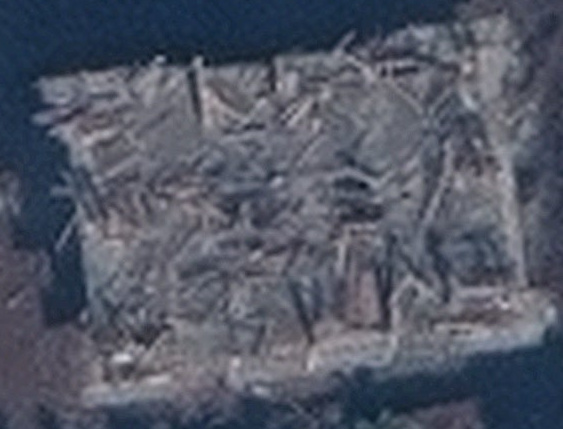

In [ ]:
Image(filename=crops[0], height=600)

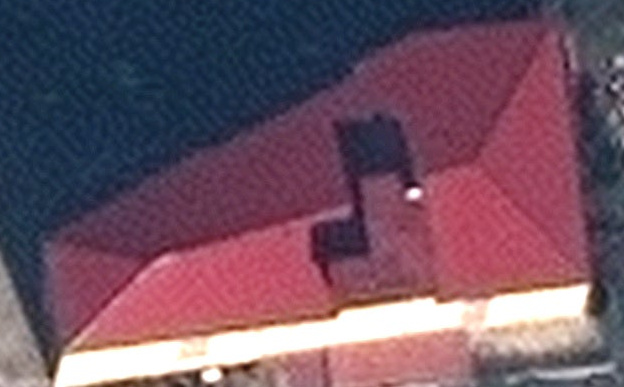

In [ ]:
Image(filename=crops[1], height=600)

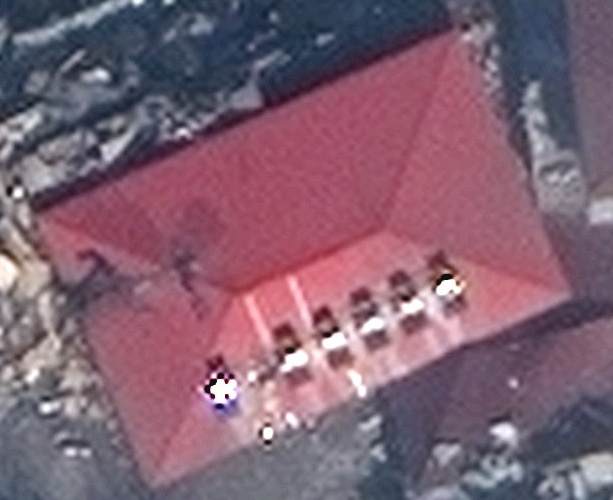

In [ ]:
Image(filename=crops[2], height=600)

You can see some Fourier ripples particularly in the first and second images. This means that at this resolution, these satellites are operating at close to their capacity. That might actually frustrate labelling attempts with data from the satellites that made these exact images. Something to think about.

\

---

\

That concludes my actions on the brief. If you want to try out my trained model with other images, run the separate notebook which pulls the model from the online repo.


# CODE - Meta AI Segment Anything (SAM) Demo


I wanted to quickly show off how well Meta's Segment Anything https://github.com/facebookresearch/segment-anything performs as a foundation model. Initially I made attempts to fine-tune on this but the data engineering was looking like a lot compared to ultralytics. Meta mention in their paper (download [here](https://ai.meta.com/research/publications/segment-anything/)) at the top of pg11 that it will be capable of using a text encoder. That means you could write a text prompt and have the model return predictions for *only* the classes you specify, e.g. buildings. Given how well the model segments, this is quite tantalising. You could automatically label data very very easily, with some QA checks after the fact.

Here is the SAM in action on the test images.

In [ ]:
!pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'

  Preparing metadata (setup.py) ... done


In [ ]:
!pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.8/367.8 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 22.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 38.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 80.0 MB/s eta 0:00:00


In [ ]:
!mkdir -p {HOME}/weights
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P {HOME}/weights

In [ ]:
import torch

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
MODEL_TYPE = "vit_h"

In [ ]:
CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(CHECKPOINT_PATH, "; exist:", os.path.isfile(CHECKPOINT_PATH))

from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)

/content/weights/sam_vit_h_4b8939.pth ; exist: True


In [ ]:
mask_generator = SamAutomaticMaskGenerator(sam)

In [ ]:
import cv2
import supervision as sv

image_bgr = cv2.imread('image_6.jpeg')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

sam_result = mask_generator.generate(image_rgb)

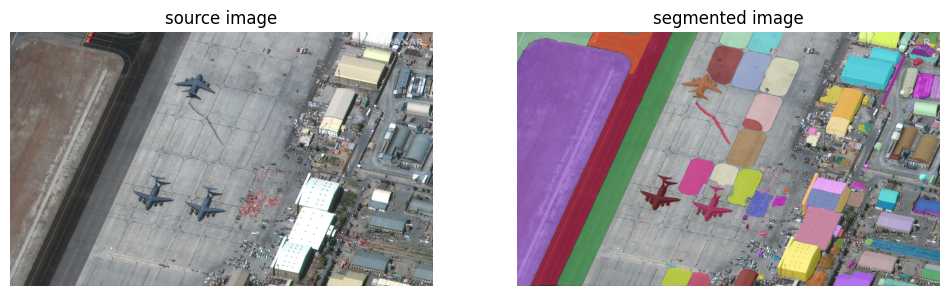

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

sv.plot_images_grid(
    images=[image_bgr, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image'])

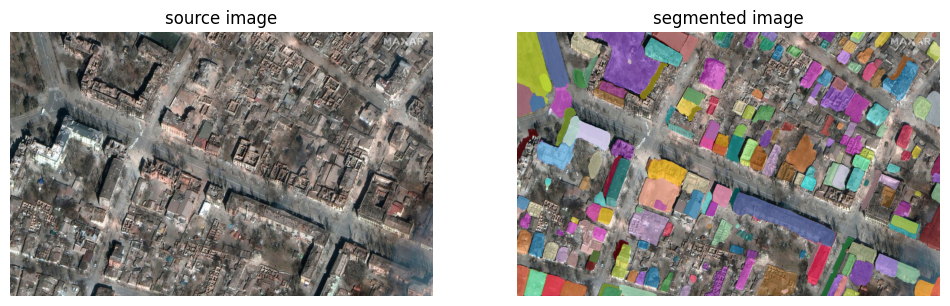

In [ ]:
image_bgr = cv2.imread('image_1.jpeg')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
sam_result = mask_generator.generate(image_rgb)
detections = sv.Detections.from_sam(sam_result=sam_result)
annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)
sv.plot_images_grid(
    images=[image_bgr, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image'])

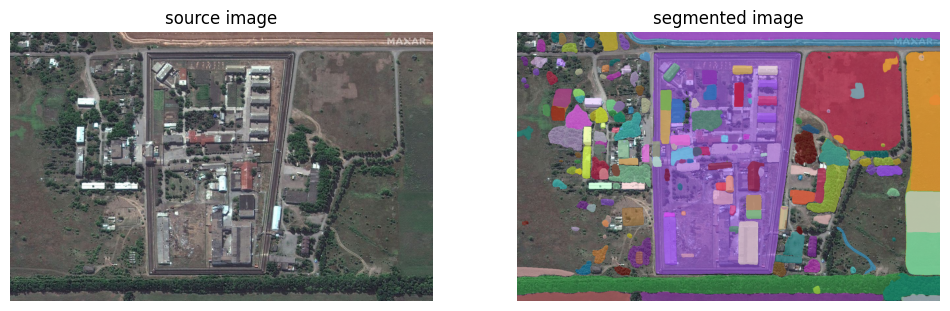

In [ ]:
image_bgr = cv2.imread('image_3.jpeg')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
sam_result = mask_generator.generate(image_rgb)
detections = sv.Detections.from_sam(sam_result=sam_result)
annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)
sv.plot_images_grid(
    images=[image_bgr, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image'])

### COMMENTS

Very impressive performance even when compared with the YOLOv8 after fine-tuning. This model is a foundation and is not predicting classes, but once it has that capability it would definitely be producing more accurate footprints. This SAM foundation model will be a very important vision tool.

# Final Remarks

The above trained instance segmentation model has been hosted on Hugging Face [here](https://colab.research.google.com/github/fraserlkennedy/MIS-response/blob/main/Live-Huggingface-model-prediction.ipynb) and I've added a separate notebook that will allow you to live test the model with other images.

The building damage assessment would be carried out after building and training a regression ResNet on xview2 damage labels, or using labelled buildings from your own data.

As mentioned in my intro, GEOjson conversion from a segmentation mask is non-trivial, essentially because there are many ways to draw lines automatic lines across a blob of pixels. Easy for us humans to do it by hand, but building an algorithm would take development time. Most implementations use [Douglas-Peucker](https://en.wikipedia.org/wiki/Ramer%E2%80%93Douglas%E2%80%93Peucker_algorithm), as I understand.